<a href="https://colab.research.google.com/github/Kryle8/Bag-Classification-Plastic-Paper-Garbage/blob/main/Bag_Classification_Plastic_Paper_Garbage.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Plastic - Paper - Garbage Bag Classification

This project demonstrates the classification of Plastic - Paper - Garbage Bag images with deep learning techniques, based on the **"Plastic - Paper - Garbage Bag Synthetic Images Dataset."**

**Kaggle Dataset:** [Plastic - Paper - Garbage Bag Synthetic Images Dataset](https://www.kaggle.com/datasets/vencerlanz09/plastic-paper-garbage-bag-synthetic-images)

**GitHub Repository:** [Bag_Classification_Plastic_Paper_Garbage](https://github.com/Kryle8/Bag-Classification-Plastic-Paper-Garbage.git)

**Google Colab Link:** [Bag_Classification_Plastic_Paper_Garbage](https://colab.research.google.com/drive/1LCODH9XBmmgmfnhN7T7Sjrb7zNW8ULtN?usp=sharing)
---

Karlryle Jhen E. Betita BSCpE 3-A  
CpETE1 Embedded System 1 - Realtime Systems

#Importing of Libraries

In [ ]:
import os
import shutil
import random
from pathlib import Path
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt

#Installing Kaggle

In [ ]:
#Upload kagggle.json
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"karlrylebetita","key":"475621a462dcaffe539afdf70cd57315"}'}

In [ ]:
# MANUAL KAGGLE SETUP IF YOU ARE IN COLAB (IGNORE IF RUN LOCALLY)
# Install the Kaggle library
!pip install kaggle --quiet

# Create a directory for the Kaggle API token
!mkdir -p ~/.kaggle

# Upload your kaggle.json file
# (You need to download this from your Kaggle account: My Account > API > Create New API Token)
# In Colab, run this cell, and it will prompt you to upload the file.

# Copy the kaggle.json to the correct directory and set permissions
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Download the dataset
!kaggle datasets download vencerlanz09/plastic-paper-garbage-bag-synthetic-images -p /content/plastic-paper-garbage-bag-synthetic-images --unzip

Dataset URL: https://www.kaggle.com/datasets/vencerlanz09/plastic-paper-garbage-bag-synthetic-images
License(s): CC-BY-SA-4.0
 97% 436M/451M [00:01<00:00, 288MB/s]
100% 451M/451M [00:01<00:00, 256MB/s]


# Data Splitting to train, test and validation

In [ ]:
# Recursively print directory structure
for root, dirs, files in os.walk(".", topdown=True):
    for name in dirs:
        print(os.path.join(root, name))

./.config
./plastic-paper-garbage-bag-synthetic-images
./.ipynb_checkpoints
./drive
./dataset_split
./sample_data
./.config/configurations
./.config/logs
./.config/logs/2025.06.03
./plastic-paper-garbage-bag-synthetic-images/ImageClassesCombinedWithCOCOAnnotations
./plastic-paper-garbage-bag-synthetic-images/Bag Classes
./plastic-paper-garbage-bag-synthetic-images/ImageClassesCombinedWithCOCOAnnotations/images_raw
./plastic-paper-garbage-bag-synthetic-images/Bag Classes/Bag Classes
./plastic-paper-garbage-bag-synthetic-images/Bag Classes/Bag Classes/Paper Bag Images
./plastic-paper-garbage-bag-synthetic-images/Bag Classes/Bag Classes/Plastic Bag Images
./plastic-paper-garbage-bag-synthetic-images/Bag Classes/Bag Classes/Garbage Bag Images
./drive/.shortcut-targets-by-id
./drive/.file-revisions-by-id
./drive/MyDrive
./drive/.Trash-0
./drive/.Encrypted
./drive/.shortcut-targets-by-id/1EmIR_lQo9o7v3t5q7J4FKNAKde4Qm5ia
./drive/.shortcut-targets-by-id/1-CANUDaqQZTYjKfeg9nXWAkwNcPu8MAF
./dri

In [ ]:
original_dir = './plastic-paper-garbage-bag-synthetic-images/Bag Classes/Bag Classes'
base_dir = './dataset_split'
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')
img_size = (224, 224)
batch_size = 32
split_ratios = (0.7, 0.15, 0.15)  # train, val, test

#Checking and converting images to jpg

In [ ]:
if os.path.exists(base_dir):
    shutil.rmtree(base_dir)

for split in [train_dir, val_dir, test_dir]:
    os.makedirs(split)

classes = [cls for cls in os.listdir(original_dir) if os.path.isdir(os.path.join(original_dir, cls))]
print("Detected classes:", classes)

for cls in classes:
    cls_path = os.path.join(original_dir, cls)
    images = [f for f in os.listdir(cls_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    random.shuffle(images)

    n_total = len(images)
    n_train = int(split_ratios[0] * n_total)
    n_val = int(split_ratios[1] * n_total)

    sets = {
        'train': images[:n_train],
        'val': images[n_train:n_train+n_val],
        'test': images[n_train+n_val:]
    }

    for set_name, file_list in sets.items():
        dest_dir = os.path.join(base_dir, set_name, cls)
        os.makedirs(dest_dir, exist_ok=True)
        for file in file_list:
            shutil.copy(os.path.join(cls_path, file), os.path.join(dest_dir, file))

print("✅ Dataset split completed.")

Detected classes: ['Paper Bag Images', 'Plastic Bag Images', 'Garbage Bag Images']
✅ Dataset split completed.


In [ ]:
main_folder = base_dir # Use the base_dir defined earlier
subfolders = ['train', 'val', 'test'] # Include 'val' as it's used

def check_images_format():
  all_jpg = True
  for subfolder in subfolders:
    for cls in classes: # Use the classes list defined earlier
      class_dir = os.path.join(main_folder, subfolder, cls)
      if not os.path.exists(class_dir):
        print(f"Warning: Directory not found - {class_dir}")
        continue

      for file in os.listdir(class_dir):
        file_path = os.path.join(class_dir, file)
        # Check for common image file extensions
        if file.lower().endswith(('.png', '.jpeg', '.bmp', '.tiff', '.gif')) and not file.lower().endswith('.jpg'):
          print(f"Non-JPG file found: {file_path}")
          all_jpg = False

  if all_jpg:
    print("✅ All images are in JPG format.")
  else:
    print("⚠️ Some non-JPG images were found. Consider converting them.")

check_images_format()

✅ All images are in JPG format.


In [ ]:
from PIL import Image

image_formats = ('.png', '.jpeg', '.bmp', '.tiff', '.gif')
for folder_type in ['train', 'val', 'test']: # Include val here
  for cls in classes:
    class_dir = os.path.join(main_folder, folder_type, cls)
    if not os.path.exists(class_dir):
      continue # Skip if directory doesn't exist
    for file in os.listdir(class_dir):
      if file.lower().endswith(image_formats):
        img_path = os.path.join(class_dir, file)
        jpg_path = os.path.splitext(img_path)[0] + '.jpg'
        try:
          with Image.open(img_path) as img:
            # Handle potential issues with GIFs and other modes
            if file.lower().endswith('.gif'):
                try:
                    img.seek(0) # Start with the first frame
                except EOFError:
                    print(f"Warning: Could not read first frame of GIF: {img_path}. Skipping conversion.")
                    continue # Skip this file

            # Convert problematic modes to RGB
            if img.mode in ('P', 'L', 'RGBA', 'LA'):
                if img.mode == 'RGBA' or img.mode == 'LA':
                    # Convert RGBA/LA to RGB with white background
                    background = Image.new('RGB', img.size, (255, 255, 255))
                    img = img.convert('RGBA') # Ensure alpha channel is present
                    background.paste(img, mask=img.split()[3] if 'A' in img.mode else None) # Use alpha as mask if available
                    img_to_save = background
                else:
                    # Convert P or L to RGB
                    img_to_save = img.convert('RGB')
            else:
                 # Assume other modes like RGB are fine
                 img_to_save = img.convert('RGB') # Ensure it's RGB before saving as JPEG

            img_to_save.save(jpg_path, 'JPEG')
            os.remove(img_path)
            print(f"Converted: {img_path} -> {jpg_path} and removed the original file.")
        except Exception as e:
            print(f"Error converting {img_path}: {e}")

print("✅ Image format conversion completed.")

✅ Image format conversion completed.


In [ ]:
check_images_format()

✅ All images are in JPG format.


#Checking of train data images by classes

In [ ]:

import matplotlib.image as mpimg

def view_random_image(target_dir, target_class):
  """
  Views a random image from a target directory and target class.

  Args:
    target_dir (str): The base directory containing class subfolders.
    target_class (str): The class name (subfolder name).
  """
  target_folder = os.path.join(target_dir, target_class)
  # Ensure the target folder exists and has images
  if not os.path.exists(target_folder) or not os.listdir(target_folder):
    print(f"Error: Target folder not found or is empty: {target_folder}")
    return None

  image_files = [f for f in os.listdir(target_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
  if not image_files:
      print(f"No image files found in {target_folder}")
      return None

  random_image = random.sample(image_files, 1)
  random_image_addr = os.path.join(target_folder, random_image[0])

  try:
      img = mpimg.imread(random_image_addr)
      plt.imshow(img)
      plt.title(target_class)
      plt.axis('off')
      print(f'Image shape: {img.shape}')
      return img
  except Exception as e:
      print(f"Error loading or displaying image {random_image_addr}: {e}")
      return None

# Example usage (assuming you have run the previous cells and have data in 'base_dir'):
# view_random_image(base_dir + '/train', 'Garbage Bag Images')
# view_random_image(base_dir + '/val', 'Plastic')
# view_random_image(base_dir + '/test', 'Paper')
# You might need to adjust the class names based on the actual folder names in your dataset

Image shape: (300, 300, 3)


array([[[ 7,  3,  0],
        [ 8,  4,  1],
        [ 8,  4,  1],
        ...,
        [ 4,  3,  1],
        [ 4,  3,  1],
        [ 4,  3,  1]],

       [[ 7,  3,  0],
        [ 8,  4,  1],
        [ 8,  4,  1],
        ...,
        [ 4,  3,  1],
        [ 4,  3,  1],
        [ 4,  3,  1]],

       [[ 7,  3,  0],
        [ 8,  4,  1],
        [ 8,  4,  1],
        ...,
        [ 4,  3,  1],
        [ 4,  3,  1],
        [ 4,  3,  1]],

       ...,

       [[36, 21,  2],
        [37, 22,  3],
        [39, 23,  7],
        ...,
        [19,  6,  0],
        [20,  5,  0],
        [21,  6,  0]],

       [[40, 25,  6],
        [41, 26,  7],
        [43, 27, 11],
        ...,
        [17,  4,  0],
        [18,  3,  0],
        [19,  4,  0]],

       [[43, 28,  9],
        [43, 28,  9],
        [44, 28, 12],
        ...,
        [19,  6,  0],
        [20,  5,  0],
        [20,  5,  0]]], dtype=uint8)
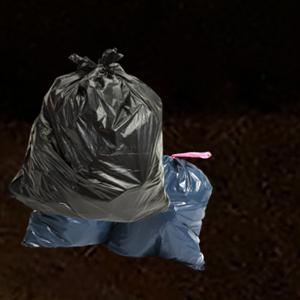

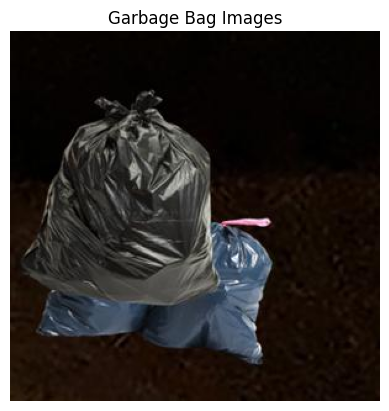

In [ ]:
view_random_image(base_dir + '/train', 'Garbage Bag Images')

Image shape: (300, 300, 3)


array([[[159, 150, 135],
        [144, 135, 120],
        [161, 152, 137],
        ...,
        [185, 181, 170],
        [185, 181, 170],
        [185, 181, 170]],

       [[144, 135, 120],
        [135, 126, 111],
        [143, 134, 119],
        ...,
        [185, 181, 170],
        [185, 181, 170],
        [185, 181, 170]],

       [[157, 148, 133],
        [161, 152, 137],
        [162, 153, 138],
        ...,
        [185, 181, 170],
        [185, 181, 170],
        [185, 181, 170]],

       ...,

       [[179, 175, 163],
        [182, 178, 166],
        [194, 190, 178],
        ...,
        [192, 184, 171],
        [204, 196, 183],
        [207, 199, 186]],

       [[176, 172, 160],
        [187, 183, 171],
        [199, 195, 183],
        ...,
        [177, 169, 156],
        [163, 155, 142],
        [153, 145, 132]],

       [[193, 189, 177],
        [205, 201, 189],
        [210, 206, 194],
        ...,
        [173, 165, 152],
        [143, 135, 122],
        [121, 113, 100]]], dtype=uint8)
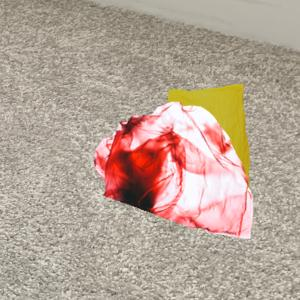

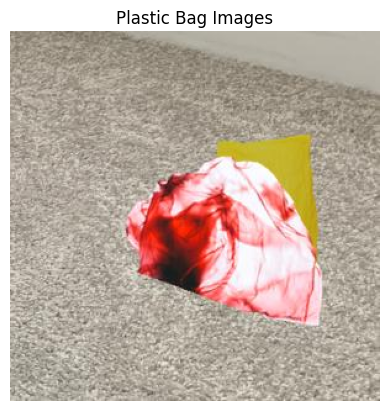

In [ ]:
view_random_image(base_dir + '/train', 'Plastic Bag Images')

Image shape: (300, 300, 3)


array([[[ 1,  2,  4],
        [ 1,  2,  4],
        [ 1,  2,  4],
        ...,
        [ 2,  1,  6],
        [ 2,  1,  6],
        [ 2,  1,  6]],

       [[ 0,  1,  3],
        [ 0,  1,  3],
        [ 0,  1,  3],
        ...,
        [ 2,  1,  6],
        [ 2,  1,  6],
        [ 2,  1,  6]],

       [[ 0,  1,  3],
        [ 0,  1,  3],
        [ 0,  1,  3],
        ...,
        [ 2,  1,  6],
        [ 2,  1,  6],
        [ 2,  1,  6]],

       ...,

       [[ 0,  0,  2],
        [ 0,  0,  2],
        [ 0,  0,  2],
        ...,
        [85, 47,  2],
        [90, 53,  8],
        [94, 57, 12]],

       [[ 0,  0,  2],
        [ 0,  0,  2],
        [ 0,  0,  2],
        ...,
        [86, 49,  4],
        [91, 54,  9],
        [93, 59, 11]],

       [[ 0,  0,  2],
        [ 0,  0,  2],
        [ 0,  0,  2],
        ...,
        [87, 50,  5],
        [91, 57, 11],
        [95, 61, 13]]], dtype=uint8)
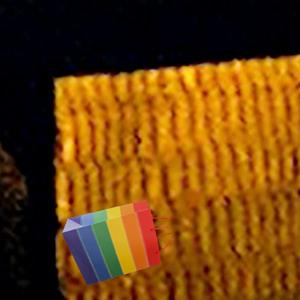

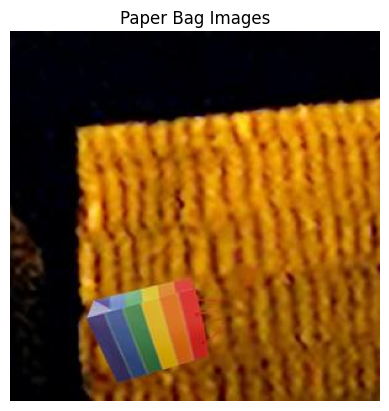

In [ ]:
view_random_image(base_dir + '/train', 'Paper Bag Images')

In [ ]:
import numpy as np
import pathlib
data_dir = pathlib.Path(train_dir)
class_names = np.array(sorted([items.name for items in data_dir.glob('*')]))
class_names


array(['Garbage Bag Images', 'Paper Bag Images', 'Plastic Bag Images'],
      dtype='<U18')

Image shape: (300, 300, 3)


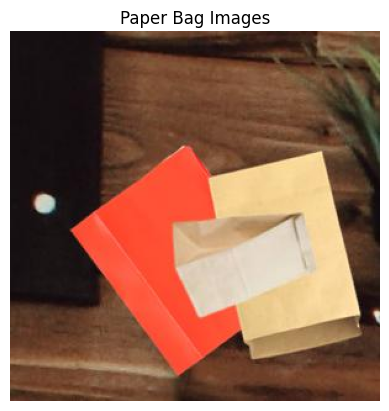

In [ ]:
img = view_random_image(target_dir='dataset_split/train/',
 target_class=random.choice(class_names.flatten().
 tolist()))

# Data Visualization

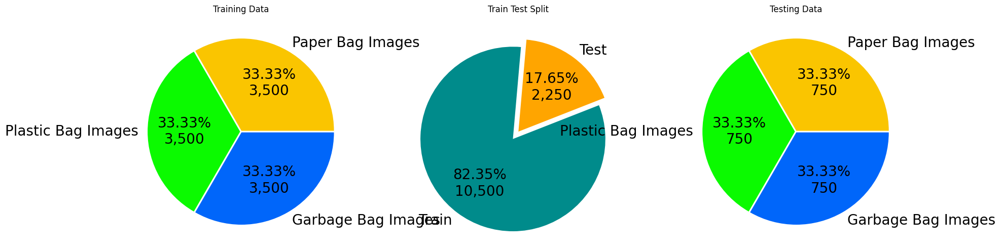

In [ ]:
# Collect class names from the split directories
class_names = [d for d in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, d))]

# Get the class index for each image in the train and test directories
train_index = []
test_index = []

for class_name in class_names:
    train_class_path = os.path.join(train_dir, class_name)
    test_class_path = os.path.join(test_dir, class_name)
    num_train_images = len(os.listdir(train_class_path))
    num_test_images = len(os.listdir(test_class_path))

    class_label_index = class_names.index(class_name)
    train_index.extend([class_label_index] * num_train_images)
    test_index.extend([class_label_index] * num_test_images)


_, ax = plt.subplots(ncols=3, figsize=(20, 14))

# Plotting training data types
class_counts = [len([x for x in train_index if x == label]) for label in set(train_index)]
ax[0].set_title('Training Data')
ax[0].pie(
    class_counts,
    labels=[label for label in class_names],
    colors=['#FAC500','#0BFA00', '#0066FA','#FA0000'],
    autopct=lambda p: '{:.2f}%\n{:,.0f}'.format(p, p * sum(class_counts) / 100),
    # Adjust the explode tuple length to match the number of classes
    explode=(0.01,) * len(class_names), # Using a tuple with 0.01 for each class
    textprops={'fontsize': 20}
)
# Plotting distribution of train test split
ax[1].set_title('Train Test Split')
ax[1].pie(
    [len(train_index), len(test_index)],
    labels=['Train','Test'],
    colors=['darkcyan', 'orange'],
    autopct=lambda p: '{:.2f}%\n{:,.0f}'.format(p, p * sum([len(train_index), len(test_index)]) / 100),
    explode=(0.1, 0),
    startangle=85,
    textprops={'fontsize': 20}
)
# Plotting testing data types
class_counts = [len([x for x in test_index if x == label]) for label in set(test_index)]
ax[2].set_title('Testing Data')
ax[2].pie(
    class_counts,
    labels=[label for label in class_names],
    colors=['#FAC500', '#0BFA00', '#0066FA', '#FA0000'],
    autopct=lambda p: '{:.2f}%\n{:,.0f}'.format(p, p * sum(class_counts) / 100),
    # Adjust the explode tuple length to match the number of classes
    explode=(0.01,) * len(class_names), # Using a tuple with 0.01 for each class
    textprops={'fontsize': 20}
)
plt.show()

In [ ]:
from tensorflow.keras.preprocessing.image import load_img
import matplotlib.pyplot as plt
import numpy as np # Make sure numpy is imported if you use it elsewhere in the function

# Function to display a list of images based on the given index
def show_images(paths, label_paths, class_mappings, index_list=range(10), im_size=250, figsize=(12, 8)):
    num_images = len(index_list)
    num_rows = (num_images + 3) // 4
    index_to_class = {v: k for k, v in class_mappings.items()}
    _, ax = plt.subplots(nrows=num_rows, ncols=4, figsize=figsize)
    ax = ax.flatten()
    for i, index in enumerate(index_list):
        if i >= num_images:
            break
        # Change the color_mode to 'rgb' or remove the argument to load in color
        image = load_img(paths[index], target_size=(im_size, im_size), color_mode='rgb') # Changed here
        ax[i].imshow(image) # No need for cmap='Greys_r' for color images
        class_name = index_to_class[label_paths[index]]
        ax[i].set_title(f'{index}: {class_name}')
        ax[i].axis('off')
    plt.tight_layout()
    plt.show()

In [ ]:
# Create a list of all training image paths in the same order as train_index
train_paths = []
# The order of os.listdir is not guaranteed, so we need to iterate in a way that
# matches the order the images were added to train_index.
# Since train_index was populated by iterating through class_names and then files
# within each class directory, we can reconstruct the paths in that order.
for class_name in class_names:
    class_path = os.path.join(train_dir, class_name)
    # Assuming os.listdir gives a consistent order across runs for a fixed directory state
    # A more robust approach might involve sorting the list of files
    files_in_class = [os.path.join(class_path, f) for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    train_paths.extend(files_in_class)


# Create class_mappings and inv_class_mappings
class_mappings = {name: i for i, name in enumerate(class_names)}
inv_class_mappings = {i: name for name, i in class_mappings.items()}

print("✅ train_paths, class_mappings, and inv_class_mappings created.")

✅ train_paths, class_mappings, and inv_class_mappings created.


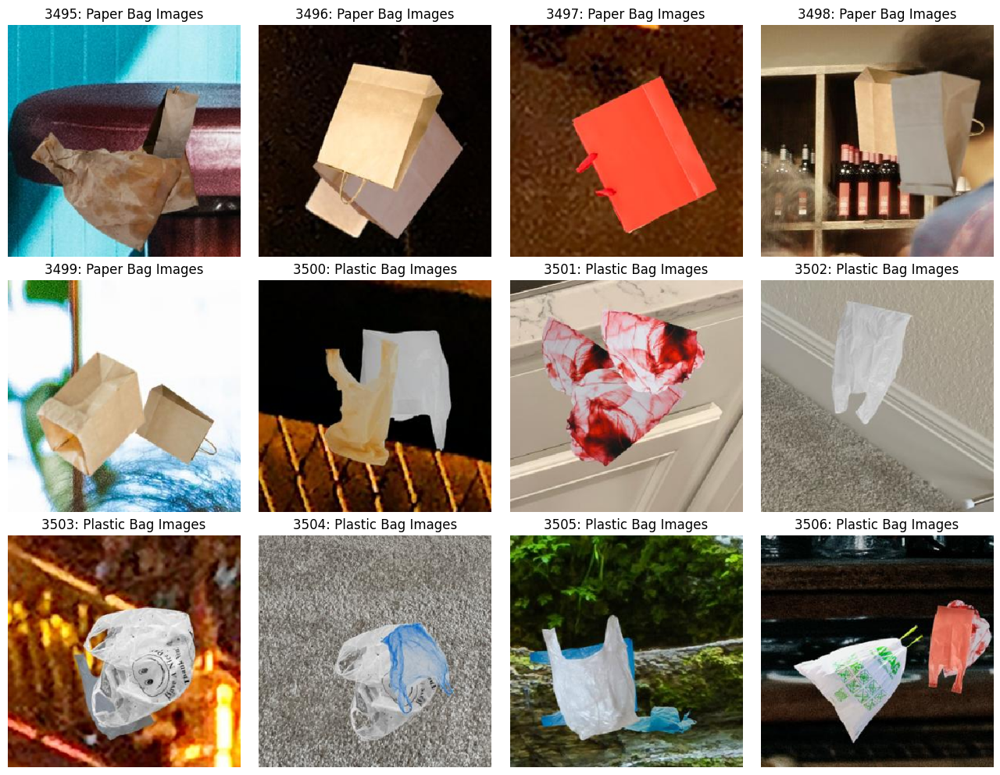

In [ ]:
show_images(train_paths, train_index, class_mappings, im_size=350, figsize=(13,10),
            index_list=range(3495, 3507))

# Data preprocessing and Training Setup

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory

IMG_SIZE = (512, 512)
BATCH_SIZE = 16

train_data = image_dataset_from_directory(directory=train_dir,
                                          batch_size=BATCH_SIZE,
                                          label_mode='categorical',
                                          image_size=IMG_SIZE)
test_data = image_dataset_from_directory(directory=test_dir,
                                         batch_size=BATCH_SIZE,
                                         label_mode='categorical',
                                         image_size=IMG_SIZE)
val_data = image_dataset_from_directory(directory=val_dir,
                                         batch_size=BATCH_SIZE,
                                         label_mode='categorical',
                                         image_size=IMG_SIZE)


Found 10500 files belonging to 3 classes.
Found 2250 files belonging to 3 classes.
Found 2250 files belonging to 3 classes.


In [ ]:
train_data, test_data

(<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 512, 512, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 3), dtype=tf.float32, name=None))>,
 <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 512, 512, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 3), dtype=tf.float32, name=None))>)

In [ ]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True
)
train_gen = train_datagen.flow_from_directory(
    train_dir, target_size=img_size, batch_size=batch_size, class_mode='categorical'
)
val_gen = ImageDataGenerator(rescale=1./255).flow_from_directory(
    val_dir, target_size=img_size, batch_size=batch_size, class_mode='categorical')
test_gen = ImageDataGenerator(rescale=1./255).flow_from_directory(
    test_dir, target_size=img_size, batch_size=batch_size, class_mode='categorical', shuffle=False)

Found 10500 images belonging to 3 classes.
Found 2250 images belonging to 3 classes.
Found 2250 images belonging to 3 classes.


In [ ]:
from tensorflow.keras.layers import RandomFlip, RandomHeight, RandomWidth, RandomRotation, RandomZoom, RandomContrast, RandomTranslation, Input
from tensorflow.keras import Sequential
import tensorflow as tf

# Define the data augmentation layer with an explicit Input layer
# Use the global IMG_SIZE to define the input shape
# Assuming IMG_SIZE is already defined as a tuple (height, width)
input_shape_augmentation = (IMG_SIZE[0], IMG_SIZE[1], 3) # Ensure 3 channels for color images

data_augmentation = Sequential([
    # Add an Input layer here to define the shape explicitly for this Sequential model
    Input(shape=input_shape_augmentation),
    RandomFlip("horizontal"),
    RandomHeight(0.1),
    RandomWidth(0.1),
    RandomRotation(0.02),
    RandomZoom(0.1),
    RandomContrast(0.1),
    RandomTranslation(0.02, 0.02),
], name='data_augmentation')

# Model Training and Analysis

In [ ]:
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, RandomFlip, RandomHeight, RandomWidth, RandomRotation, RandomZoom, RandomContrast, RandomTranslation, Input, GlobalAveragePooling2D
from tensorflow.keras import Sequential, models
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

# Ensure IMG_SIZE and classes are defined before this cell
# IMG_SIZE = (512, 512) # Assuming this is defined earlier as in the context
# classes = [...] # Assuming this is defined earlier as in the context

# Define the input shape based on IMG_SIZE
input_shape = (IMG_SIZE[0], IMG_SIZE[1], 3)

# Define the data augmentation layer (still as a Sequential for reusability)
# It will take an input and return an augmented output
data_augmentation = Sequential([
    Input(shape=input_shape), # Define input shape for the augmentation block
    RandomFlip("horizontal"),
    RandomHeight(0.1),
    RandomWidth(0.1),
    RandomRotation(0.02),
    RandomZoom(0.1),
    RandomContrast(0.1),
    RandomTranslation(0.02, 0.02),
], name='data_augmentation')

# Build the main model using the Functional API or by explicitly chaining layers
# We'll use the Functional API for clarity when the input layer is separate

# Define the input layer for the main model
input_tensor = Input(shape=input_shape, name='input_image')

# Apply data augmentation first
x = data_augmentation(input_tensor)

# Add convolutional layers - Added padding='same'
x = Conv2D(64, (5, 5), activation='relu', padding='same', name='conv2d_1')(x)
x = MaxPooling2D((3, 3), name='maxpooling2d_1')(x)

# Added padding='same'
x = Conv2D(64, (5, 5), activation='relu', padding='same', name='conv2d_2')(x)
x = MaxPooling2D((3, 3), name='maxpooling2d_2')(x)

# Added padding='same'
x = Conv2D(128, (4, 4), activation='relu', padding='same', name='conv2d_3')(x)
x = MaxPooling2D((2, 2), name='maxpooling2d_3')(x)

# Added padding='same'
x = Conv2D(128, (4, 4), activation='relu', padding='same', name='conv2d_4')(x)
x = MaxPooling2D((2, 2), name='maxpooling2d_4')(x)

# Replace Flatten and the first Dense layer with GlobalAveragePooling2D
# x = Flatten(name='flatten')(x) # Removed Flatten
x = GlobalAveragePooling2D(name='global_average_pooling2d')(x) # Added GlobalAveragePooling2D

# Add dense layers (now connected after GlobalAveragePooling2D)
# The first Dense layer now receives input shape (None, 128) from GlobalAveragePooling2D
# We can keep the 512 units, or adjust if needed. Let's keep 512 for now.
x = Dense(512, activation='relu', name='dense_1')(x)
x = Dropout(0.5, name='dropout_1')(x)
output_tensor = Dense(len(classes), activation='softmax', name='output_dense')(x)

# Create the model using the Input and Output tensors
model = models.Model(inputs=input_tensor, outputs=output_tensor, name='image_classifier')


optimizer = Adam(learning_rate=0.001, beta_1=0.85, beta_2=0.9925)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "image_classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_image (InputLayer)        │ (None, 512, 512, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, None, None, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, None, None, 64) │         4,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ maxpooling2d_1 (MaxPooling2D)   │ (None, None, None, 64) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, None, None, 64) │       102,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ maxpooling2d_2 (MaxPooling2D)   │ (None, None, None, 64) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, None, None,     │       131,200 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ maxpooling2d_3 (MaxPooling2D)   │ (None, None, None,     │             0 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, None, None,     │       262,272 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ maxpooling2d_4 (MaxPooling2D)   │ (None, None, None,     │             0 │
│                                 │ 128)                   │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_dense (Dense)            │ (None, 3)              │         1,539 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 568,387 (2.17 MB)

 Trainable params: 568,387 (2.17 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(
    'model.keras', save_best_only=True, monitor='val_accuracy', mode='max', verbose=1
)

lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=2,
    verbose=1
)

early_stop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=4,
    restore_best_weights=True
)

In [ ]:
history = model.fit(
    train_data, # Use the tf.data.Dataset
    epochs=30,
    validation_data=val_data, # Use the tf.data.Dataset
    callbacks=[lr_callback, early_stop, checkpoint]
)

Epoch 1/30
657/657 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.4502 - loss: 1.0154
Epoch 1: val_accuracy improved from -inf to 0.72578, saving model to model.keras
657/657 ━━━━━━━━━━━━━━━━━━━━ 715s 1s/step - accuracy: 0.4504 - loss: 1.0152 - val_accuracy: 0.7258 - val_loss: 0.5630 - learning_rate: 0.0010
Epoch 2/30
657/657 ━━━━━━━━━━━━━━━━━━━━ 0s 865ms/step - accuracy: 0.7071 - loss: 0.6609
Epoch 2: val_accuracy improved from 0.72578 to 0.77111, saving model to model.keras
657/657 ━━━━━━━━━━━━━━━━━━━━ 571s 869ms/step - accuracy: 0.7071 - loss: 0.6609 - val_accuracy: 0.7711 - val_loss: 0.5480 - learning_rate: 0.0010
Epoch 3/30
657/657 ━━━━━━━━━━━━━━━━━━━━ 0s 756ms/step - accuracy: 0.7832 - loss: 0.5082
Epoch 3: val_accuracy improved from 0.77111 to 0.79911, saving model to model.keras
657/657 ━━━━━━━━━━━━━━━━━━━━ 498s 759ms/step - accuracy: 0.7832 - loss: 0.5082 - val_accuracy: 0.7991 - val_loss: 0.4822 - learning_rate: 0.0010
Epoch 4/30
657/657 ━━━━━━━━━━━━━━━━━━━━ 0s 646ms/step - ac

In [ ]:
from tensorflow.keras.models import load_model # Import load_model

model = load_model('model.keras')
loss, acc = model.evaluate(test_data) # Use the tf.data.Dataset
print(f"📊 Validation Accuracy: {acc:.4f}")

141/141 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - accuracy: 0.9577 - loss: 0.1252
📊 Validation Accuracy: 0.9609


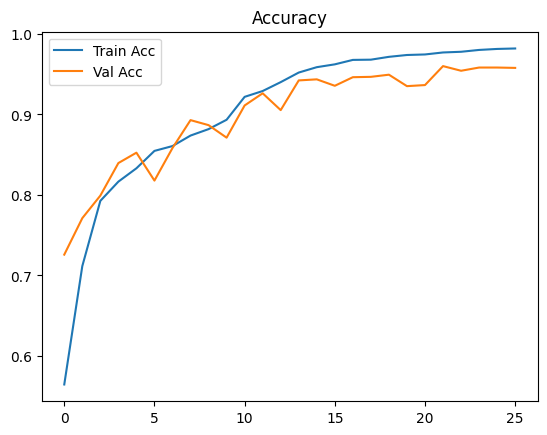

In [ ]:

plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.title('Accuracy')
plt.legend()
plt.show()

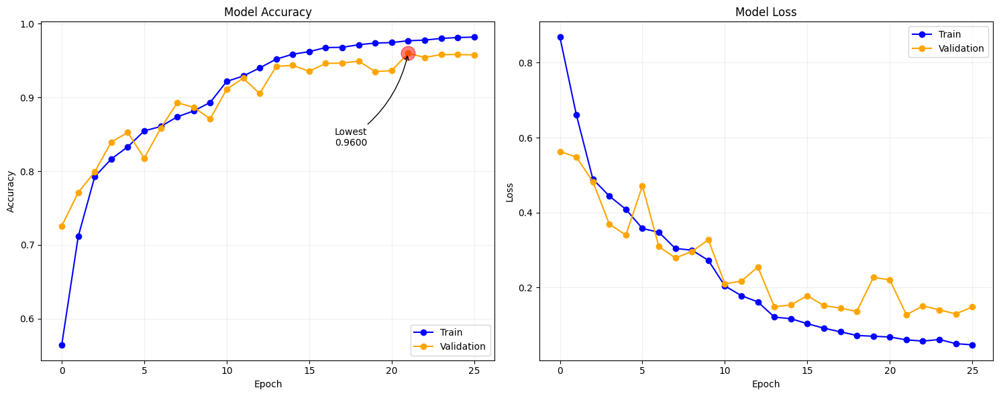

In [ ]:
import numpy as np
_, ax = plt.subplots(ncols=2, figsize=(15, 6))

# Plotting training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], marker='o', linestyle='-', color='blue')
ax[0].plot(history.history['val_accuracy'], marker='o', linestyle='-', color='orange')
ax[0].set_title('Model Accuracy')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Accuracy')
ax[0].legend(['Train', 'Validation'], loc='lower right')
ax[0].grid(alpha=0.2)

# Plotting training and validation loss over epochs
ax[1].plot(history.history['loss'], marker='o', linestyle='-', color='blue')
ax[1].plot(history.history['val_loss'], marker='o', linestyle='-', color='orange')
ax[1].set_title('Model Loss')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Loss')
ax[1].legend(['Train', 'Validation'], loc='upper right')
ax[1].grid(alpha=0.2)

# Highlight lowest validation accuracy
min_val_acc_epoch = np.argmax(history.history['val_accuracy'])
min_val_acc = np.max(history.history['val_accuracy'])
ax[0].plot(min_val_acc_epoch, min_val_acc, 'ro', markersize=15, alpha=0.5)
ax[0].annotate(f'Lowest\n{min_val_acc:.4f}', xy=(min_val_acc_epoch, min_val_acc),
               xytext=(min_val_acc_epoch - 100, min_val_acc - 100), textcoords='offset points',
               arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=.2'))

plt.tight_layout()
plt.show()

In [ ]:
# Using test data for true and predictions
true_labels = []
predicted_labels = []

test_ds_preprocessed = test_data # Assuming test_data is already preprocessed or doesn't need further preprocessing for evaluation

for images, labels in test_ds_preprocessed.unbatch():

    true_label = np.argmax(labels.numpy())
    true_labels.append(true_label)

    pred = model.predict(tf.expand_dims(images, 0), verbose=False)
    predicted_label = np.argmax(pred)
    predicted_labels.append(predicted_label)

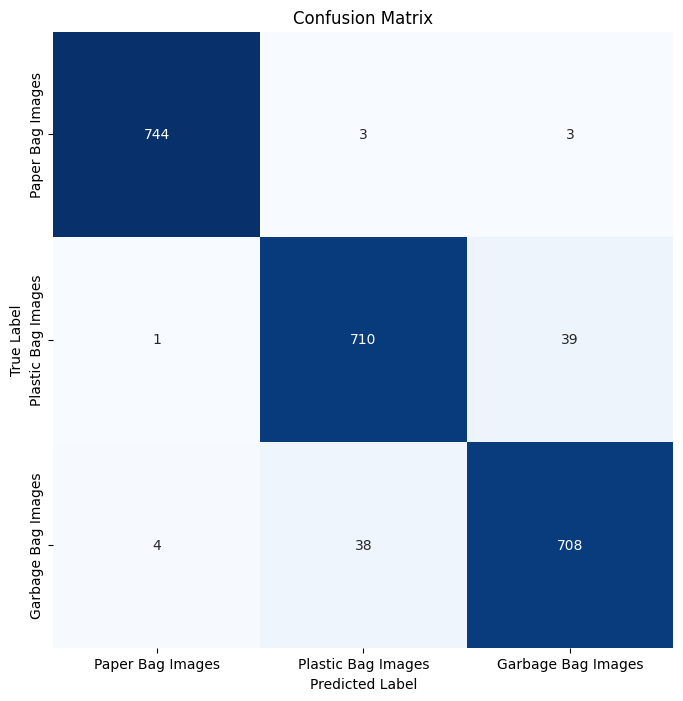

Class-wise metrics:
Class: Paper Bag Images
Precision: 0.9933
Recall: 0.9920
F1-Score: 0.9927

Class: Plastic Bag Images
Precision: 0.9454
Recall: 0.9467
F1-Score: 0.9460

Class: Garbage Bag Images
Precision: 0.9440
Recall: 0.9440
F1-Score: 0.9440

Overall Accuracy: 0.9609


In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

def plot_confusion_matrix(true_labels, predicted_labels, class_mappings, metrics=False, cmap='Blues'):
    """
    Plots the confusion matrix and optionally prints classification metrics.

    Args:
        true_labels (list or array): True labels.
        predicted_labels (list or array): Predicted labels.
        class_mappings (dict): A dictionary mapping class names to their integer indices.
        metrics (bool, optional): If True, prints precision, recall, F1-score, and accuracy. Defaults to False.
        cmap (str, optional): Colormap for the heatmap. Defaults to 'Blues'.
    """
    # Compute confusion matrix
    cm = confusion_matrix(true_labels, predicted_labels)
    num_classes = len(class_mappings) # Get number of classes from the mapping

    plt.figure(figsize=(8, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap=cmap, cbar=False)
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")


    class_names_ordered = [list(class_mappings.keys())[i] for i in range(num_classes)]

    plt.xticks(ticks=np.arange(num_classes) + 0.5, labels=class_names_ordered, ha='center')
    plt.yticks(ticks=np.arange(num_classes) + 0.5, labels=class_names_ordered, va='center')
    plt.show()

    if metrics:
        precision = np.diag(cm) / (np.sum(cm, axis=0) + 1e-6)
        recall = np.diag(cm) / (np.sum(cm, axis=1) + 1e-6)
        f1_scores = 2 * precision * recall / (precision + recall + 1e-6)
        accuracy = np.sum(np.diag(cm)) / np.sum(cm)

        print("Class-wise metrics:")
        for i in range(num_classes):
            class_name = class_names_ordered[i]
            print(f"\033[94mClass: {class_name}\033[0m")
            print(f"Precision: {precision[i]:.4f}")
            print(f"Recall: {recall[i]:.4f}")
            print(f"F1-Score: {f1_scores[i]:.4f}\n")

        print(f"\033[92mOverall Accuracy: {accuracy:.4f}\033[0m")

plot_confusion_matrix(true_labels, predicted_labels, class_mappings, metrics=True)

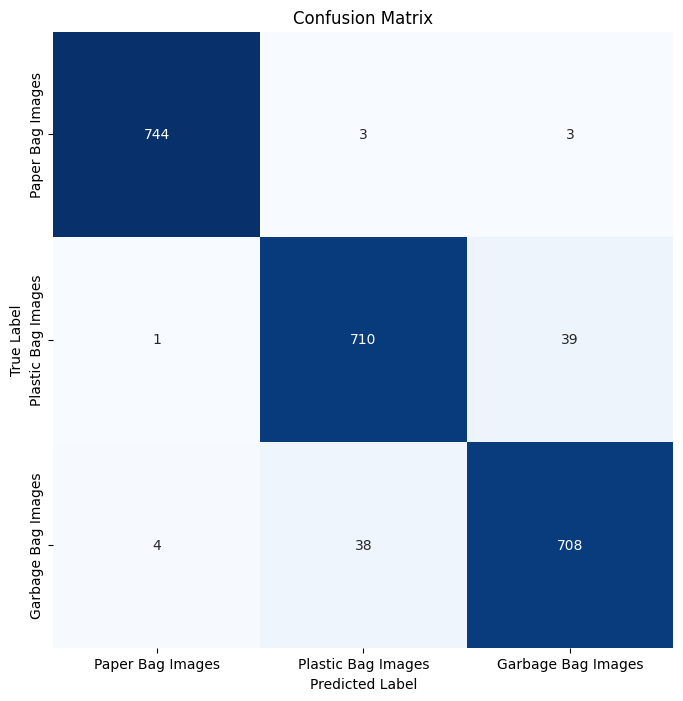

Class-wise metrics:
Class: Paper Bag Images
Precision: 0.9933
Recall: 0.9920
F1-Score: 0.9927

Class: Plastic Bag Images
Precision: 0.9454
Recall: 0.9467
F1-Score: 0.9460

Class: Garbage Bag Images
Precision: 0.9440
Recall: 0.9440
F1-Score: 0.9440

Overall Accuracy: 0.9609


In [ ]:
# Confusion matrix and netrics from predictions
plot_confusion_matrix(true_labels,
                      predicted_labels,
                      class_mappings,
                      metrics=True)

# Model Analysis and statistics

In [ ]:
from sklearn.metrics import classification_report

if isinstance(class_names, np.ndarray):
    class_names_list = sorted(class_names.flatten().tolist())
else:
    class_names_list = sorted(class_names)

class_names_ordered = class_names_list

print(classification_report(true_labels, predicted_labels, target_names=class_names_ordered))

                    precision    recall  f1-score   support

Garbage Bag Images       0.99      0.99      0.99       750
  Paper Bag Images       0.95      0.95      0.95       750
Plastic Bag Images       0.94      0.94      0.94       750

          accuracy                           0.96      2250
         macro avg       0.96      0.96      0.96      2250
      weighted avg       0.96      0.96      0.96      2250



In [ ]:

from sklearn.metrics import classification_report
import seaborn as sns
from sklearn.metrics import confusion_matrix
classification_report_dict = classification_report(true_labels, predicted_labels, target_names=class_names_ordered, output_dict=True)

In [ ]:
class_f1_scores = {}
for k, v in classification_report_dict.items():
  # Stop when reaching accuracy or macro/weighted avg
  if k in ["accuracy", "macro avg", "weighted avg"]:
    break
  else:
    # Use the class name directly from the keys of the dictionary
    class_f1_scores[k] = v["f1-score"]

class_f1_scores

{'Garbage Bag Images': 0.9926617745163442,
 'Paper Bag Images': 0.9460359760159893,
 'Plastic Bag Images': 0.944}

In [ ]:

import pandas as pd
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns # Import seaborn for confusion matrix plotting

f1_scores_1 = pd.DataFrame({"class_name": list(class_f1_scores.keys()),
                            "f1-score": list(class_f1_scores.values())}).sort_values("f1-score", ascending=False)
f1_scores_1.head()


,class_name,f1-score
0,Garbage Bag Images,0.992662
1,Paper Bag Images,0.946036
2,Plastic Bag Images,0.944000


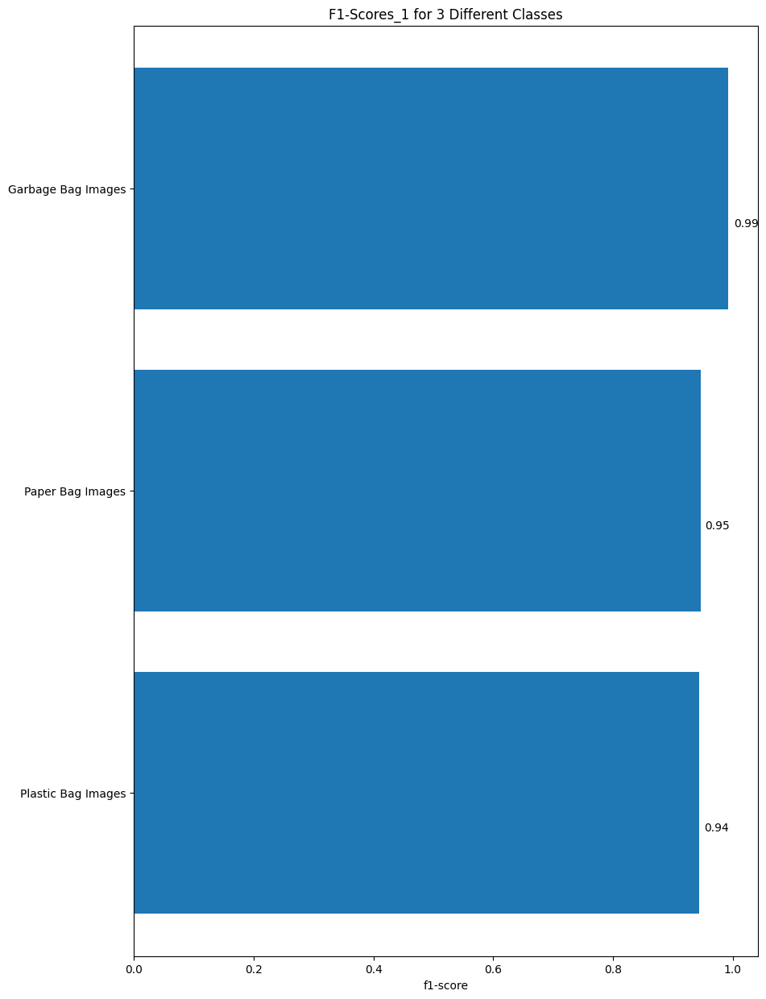

In [ ]:
import pandas as pd
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

fig, ax = plt.subplots(figsize=(10, 15))
scores = ax.barh(range(len(f1_scores_1)), f1_scores_1["f1-score"].values)
ax.set_yticks(range(len(f1_scores_1)))
ax.set_yticklabels(list(f1_scores_1["class_name"]))
ax.set_xlabel("f1-score")
ax.set_title("F1-Scores_1 for 3 Different Classes")
ax.invert_yaxis();

def autolabel(rects):
  """
  Attach a text label above each bar displaying its height (it's value).
  """
  for rect in rects:
    width = rect.get_width()
    ax.text(1.03*width, rect.get_y() + rect.get_height()/1.5,
            f"{width:.2f}",
            ha='center', va='bottom')

autolabel(scores)
plt.show()

# Model Testing and Analysis

In [ ]:

def load_and_prep_image(filename, img_shape=512, scale=True):
  """
  Reads an image file, decodes it into a tensor, resizes it, and optionally scales it.

  Args:
    filename (str): Path to the image file.
    img_shape (int, optional): The desired square shape (width and height) of the image.
                               Defaults to 512.
    scale (bool, optional): Whether to scale the pixel values from 0-255 to 0-1.
                            Defaults to True.

  Returns:
    tf.Tensor: The loaded, preprocessed image tensor.
  """
  # Read the image file
  img = tf.io.read_file(filename)
  # Decode the image to a tensor (channels=3 for RGB)
  img = tf.io.decode_image(img, channels=3)
  # Resize the image
  img = tf.image.resize(img, [img_shape, img_shape])
  # Scale the image if requested
  if scale:
    return img / 255.
  else:
    return img


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


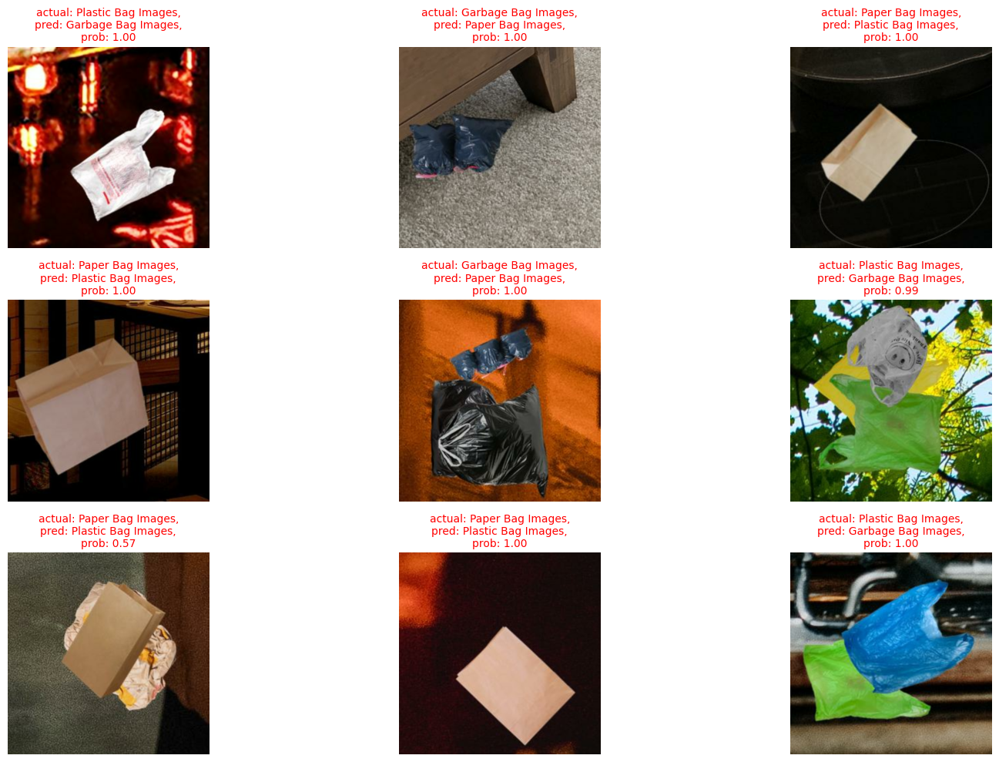

In [ ]:
plt.figure(figsize=(17, 10))
n = 9
for i in range(n):
  # Ensure class_names is a list for random.choice
  if isinstance(class_names, np.ndarray):
    class_names_list = class_names.flatten().tolist()
  else:
    class_names_list = class_names

  class_name = random.choice(class_names_list)
  class_dir_path = os.path.join(test_dir, class_name)

  # Ensure the directory exists before listing files
  if not os.path.exists(class_dir_path) or not os.listdir(class_dir_path):
      print(f"Warning: No images found in {class_dir_path}. Skipping.")
      continue

  # Filter for actual image files
  image_files = [f for f in os.listdir(class_dir_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

  if not image_files:
      print(f"Warning: No image files found in {class_dir_path}. Skipping.")
      continue

  filename = random.choice(image_files)
  filepath = os.path.join(class_dir_path, filename) # Corrected filepath construction

  # Use the load_and_prep_image function defined in the preceding code
  img = load_and_prep_image(filepath, img_shape=IMG_SIZE[0], scale=False) # Use IMG_SIZE and don't scale for display

  # Make prediction with the loaded model (assuming 'model' is the trained model)
  pred_prob = model.predict(tf.expand_dims(img, axis=0))
  pred_class = class_names_list[tf.argmax(pred_prob[0])] # Use tf.argmax for tensor output

  plt.subplot(3, 3, i + 1)
  plt.imshow(img / 255.) # Scale for display if img was not scaled during loading
  if class_name == pred_class:
    title_color = "g"
  else:
    title_color = "r"
  plt.title(
      f"actual: {class_name},\npred: {pred_class},\nprob: {pred_prob.max():.2f}",
      c=title_color,
      fontsize=10 # Adjust fontsize for better readability
  )
  plt.axis(False)

plt.tight_layout() # Adjust layout to prevent titles overlapping
plt.show()


In [ ]:

filepaths = []
for filepath in tf.data.Dataset.list_files(os.path.join(test_dir, "*/*.jpg"),
  shuffle=False):
  filepaths.append(filepath.numpy().decode('utf-8'))

In [ ]:
print(f"Length of filepaths: {len(filepaths)}")
print(f"Length of y_labels: {len(true_labels)}")
print(f"Length of pred_classes_1: {len(predicted_labels)}")
print(f"Length of pred_probs_1: {len([model.predict(tf.expand_dims(load_and_prep_image(fp, img_shape=IMG_SIZE[0], scale=False), axis=0)).max() for fp in filepaths])}") # Assuming pred_probs_1 should store the highest probability for each image

Length of filepaths: 2250
Length of y_labels: 2250
Length of pred_classes_1: 2250
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━

In [ ]:
print(filepaths[:10])
print(true_labels[:10])
print(len(true_labels))

['./dataset_split/test/Garbage Bag Images/00000003.jpg', './dataset_split/test/Garbage Bag Images/00000017.jpg', './dataset_split/test/Garbage Bag Images/00000026.jpg', './dataset_split/test/Garbage Bag Images/00000033.jpg', './dataset_split/test/Garbage Bag Images/00000042.jpg', './dataset_split/test/Garbage Bag Images/00000050.jpg', './dataset_split/test/Garbage Bag Images/00000053.jpg', './dataset_split/test/Garbage Bag Images/00000066.jpg', './dataset_split/test/Garbage Bag Images/00000068.jpg', './dataset_split/test/Garbage Bag Images/00000078.jpg']
[np.int64(0), np.int64(0), np.int64(0), np.int64(1), np.int64(1), np.int64(2), np.int64(1), np.int64(0), np.int64(1), np.int64(0)]
2250


In [ ]:
import pandas as pd

pred_probs_1 = model.predict(test_data)
pred_classes_1 = np.argmax(pred_probs_1, axis=1)

min_length = len(filepaths)
y_labels = true_labels
pred_classes = predicted_labels

min_length = len(filepaths)

y_labels_sliced = y_labels[:min_length]
pred_classes_sliced = pred_classes[:min_length]

pred_conf_sliced = pred_probs_1[:min_length].max(axis=1)

if isinstance(class_names, np.ndarray):
    class_names_list = class_names.flatten().tolist()
else:
    class_names_list = class_names

pred_df_1 = pd.DataFrame({
  "img_path": filepaths,
  "y_true": y_labels_sliced,
  "y_pred": pred_classes_sliced,
  "pred_conf": pred_conf_sliced,
  "y_true_classname": [class_names_list[i] for i in y_labels_sliced],
  "y_pred_classname": [class_names_list[i] for i in pred_classes_sliced]
})

pred_df_1

141/141 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step


,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname
0,./dataset_split/test/Garbage Bag Images/000000...,0,0,1.000000,Paper Bag Images,Paper Bag Images
1,./dataset_split/test/Garbage Bag Images/000000...,0,0,1.000000,Paper Bag Images,Paper Bag Images
2,./dataset_split/test/Garbage Bag Images/000000...,0,0,1.000000,Paper Bag Images,Paper Bag Images
3,./dataset_split/test/Garbage Bag Images/000000...,1,1,1.000000,Plastic Bag Images,Plastic Bag Images
4,./dataset_split/test/Garbage Bag Images/000000...,1,1,0.999989,Plastic Bag Images,Plastic Bag Images
...,...,...,...,...,...,...
2245,./dataset_split/test/Plastic Bag Images/000049...,1,2,1.000000,Plastic Bag Images,Garbage Bag Images
2246,./dataset_split/test/Plastic Bag Images/000049...,0,0,1.000000,Paper Bag Images,Paper Bag Images
2247,./dataset_split/test/Plastic Bag Images/000049...,2,2,1.000000,Garbage Bag Images,Garbage Bag Images
2248,./dataset_split/test/Plastic Bag Images/000049...,0,0,1.000000,Paper Bag Images,Paper Bag Images


In [ ]:
pred_df_1["pred_correct"] = pred_df_1["y_true"] == pred_df_1["y_pred"]
pred_df_1

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
0,./dataset_split/test/Garbage Bag Images/000000...,0,0,1.000000,Paper Bag Images,Paper Bag Images,True
1,./dataset_split/test/Garbage Bag Images/000000...,0,0,1.000000,Paper Bag Images,Paper Bag Images,True
2,./dataset_split/test/Garbage Bag Images/000000...,0,0,1.000000,Paper Bag Images,Paper Bag Images,True
3,./dataset_split/test/Garbage Bag Images/000000...,1,1,1.000000,Plastic Bag Images,Plastic Bag Images,True
4,./dataset_split/test/Garbage Bag Images/000000...,1,1,0.999989,Plastic Bag Images,Plastic Bag Images,True
...,...,...,...,...,...,...,...
2245,./dataset_split/test/Plastic Bag Images/000049...,1,2,1.000000,Plastic Bag Images,Garbage Bag Images,False
2246,./dataset_split/test/Plastic Bag Images/000049...,0,0,1.000000,Paper Bag Images,Paper Bag Images,True
2247,./dataset_split/test/Plastic Bag Images/000049...,2,2,1.000000,Garbage Bag Images,Garbage Bag Images,True
2248,./dataset_split/test/Plastic Bag Images/000049...,0,0,1.000000,Paper Bag Images,Paper Bag Images,True


In [ ]:
correct_1 = pred_df_1[pred_df_1["pred_correct"] == True].sort_values("pred_conf", ascending=True)[:]
correct_1

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
1989,./dataset_split/test/Plastic Bag Images/000034...,0,0,0.491852,Paper Bag Images,Paper Bag Images,True
949,./dataset_split/test/Paper Bag Images/00001400...,0,0,0.497737,Paper Bag Images,Paper Bag Images,True
1760,./dataset_split/test/Plastic Bag Images/000017...,2,2,0.501483,Garbage Bag Images,Garbage Bag Images,True
1368,./dataset_split/test/Paper Bag Images/00004114...,2,2,0.505970,Garbage Bag Images,Garbage Bag Images,True
1520,./dataset_split/test/Plastic Bag Images/000001...,1,1,0.506402,Plastic Bag Images,Plastic Bag Images,True
...,...,...,...,...,...,...,...
2247,./dataset_split/test/Plastic Bag Images/000049...,2,2,1.000000,Garbage Bag Images,Garbage Bag Images,True
2248,./dataset_split/test/Plastic Bag Images/000049...,0,0,1.000000,Paper Bag Images,Paper Bag Images,True
2249,./dataset_split/test/Plastic Bag Images/000049...,0,0,1.000000,Paper Bag Images,Paper Bag Images,True
0,./dataset_split/test/Garbage Bag Images/000000...,0,0,1.000000,Paper Bag Images,Paper Bag Images,True


In [ ]:
wrong_1 = pred_df_1[pred_df_1["pred_correct"] == False].sort_values("pred_conf", ascending=False)[:]
wrong_1

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
28,./dataset_split/test/Garbage Bag Images/000002...,1,2,1.000000,Plastic Bag Images,Garbage Bag Images,False
56,./dataset_split/test/Garbage Bag Images/000004...,2,1,1.000000,Garbage Bag Images,Plastic Bag Images,False
144,./dataset_split/test/Garbage Bag Images/000010...,1,2,1.000000,Plastic Bag Images,Garbage Bag Images,False
356,./dataset_split/test/Garbage Bag Images/000023...,2,1,1.000000,Garbage Bag Images,Plastic Bag Images,False
286,./dataset_split/test/Garbage Bag Images/000019...,1,2,1.000000,Plastic Bag Images,Garbage Bag Images,False
...,...,...,...,...,...,...,...
43,./dataset_split/test/Garbage Bag Images/000003...,2,1,0.772047,Garbage Bag Images,Plastic Bag Images,False
2107,./dataset_split/test/Plastic Bag Images/000040...,2,1,0.723442,Garbage Bag Images,Plastic Bag Images,False
325,./dataset_split/test/Garbage Bag Images/000021...,2,1,0.705285,Garbage Bag Images,Plastic Bag Images,False
36,./dataset_split/test/Garbage Bag Images/000003...,1,2,0.622181,Plastic Bag Images,Garbage Bag Images,False


In [ ]:
print(f'out of {len(y_labels)} samples\nmodel_1: wrong:{len(wrong_1)}, correct:{len(correct_1)}')


out of 2250 samples
model_1: wrong:88, correct:2162


In [ ]:
def plot_sample_predictions(model, dataset, index_to_class, num_samples=9, figsize=(13, 12)):
    """
    Plots a sample of images from a dataset with their true and predicted labels.
    Displays images in color.

    Args:
      model (tf.keras.Model): Trained classification model.
      dataset (tf.data.Dataset): The dataset containing the images and labels.
      index_to_class (dict): Mapping from class index to class name.
      num_samples (int, optional): Number of samples to plot. Defaults to 9.
      figsize (tuple, optional): Size of the figure. Defaults to (13, 12).
    """
    plt.figure(figsize=figsize)
    num_rows = num_cols = int(np.ceil(np.sqrt(num_samples))) # Use ceil to ensure enough slots

    iterator = iter(dataset.unbatch())

    for i in range(num_samples): # Iterate from 0 to num_samples-1 for subplot indexing
        try:
            image, true_label = next(iterator)
        except StopIteration:
            print(f"Warning: Dataset exhausted. Displayed {i} samples out of {num_samples} requested.")
            break # Stop if the dataset has fewer samples than requested

        if image.shape[-1] == 1: # If grayscale, convert to RGB by repeating the channel
            image = tf.image.grayscale_to_rgb(image)
        elif image.shape[-1] != 3:
             print(f"Warning: Unexpected number of channels ({image.shape[-1]}) for image {i}. Attempting to proceed.")


        image_batch = tf.expand_dims(image, 0) # Add batch dimension

        # Make prediction
        predictions = model.predict(image_batch, verbose=False)
        predicted_label = np.argmax(predictions, axis=1)[0]

        # Get true and predicted class names
        true_class_index = np.argmax(true_label.numpy())
        true_class = index_to_class[true_class_index]
        predicted_class = index_to_class[predicted_label]

        # Determine title color
        title_color = 'green' if true_class_index == predicted_label else 'red'

        # Plot the image
        plt.subplot(num_rows, num_cols, i + 1) # Use i+1 for 1-based subplot indexing

        plt.imshow(image.numpy().squeeze() / 255.0 if image.numpy().max() > 1.0 else image.numpy().squeeze())
        plt.title(f"True: {true_class}\nPred: {predicted_class}", color=title_color)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

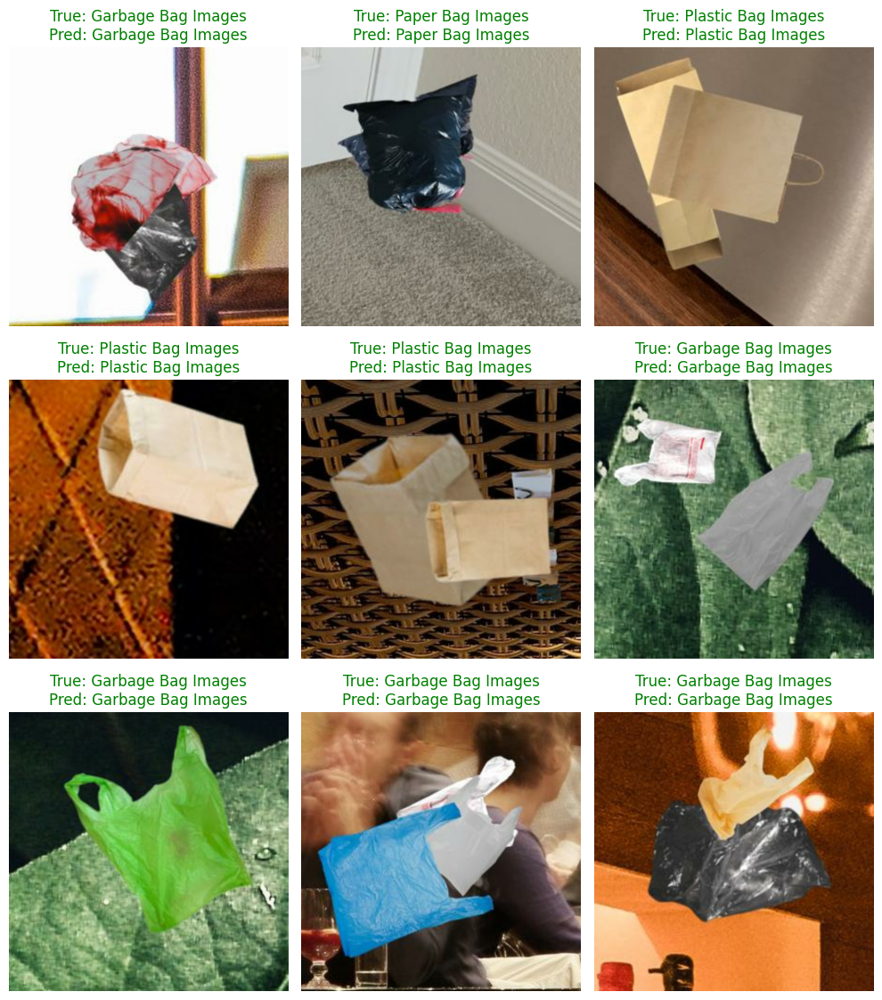

In [ ]:
# Plottinng samples with predictions
plot_sample_predictions(model=model,
                        dataset=test_ds_preprocessed,
                        index_to_class=inv_class_mappings,
                        num_samples=9,
                        figsize=(10, 11.5))

In [ ]:
def plot_misclassified_samples_readable_v2(model, dataset, index_to_class, num_samples_to_check=200, figsize=(12, 12), title_fontsize=10):
    """
    Plots examples of misclassified images with their true and predicted labels.
    Attempts to ensure images are in a plottable RGB format for better display.
    Includes improved title readability.

    Args:
        model (tf.keras.Model): The trained model.
        dataset (tf.data.Dataset): The dataset to evaluate for misclassifications.
        index_to_class (dict): A dictionary mapping integer indices to class names.
        num_samples_to_check (int, optional): Number of samples from the dataset
                                             to check for misclassifications. Defaults to 200.
        figsize (tuple, optional): The size of the plot. Defaults to (12, 12).
        title_fontsize (int, optional): Font size for the subplot titles. Defaults to 10.
    """
    misclassified_images = []
    misclassified_labels = []
    misclassified_predictions = []

    # Iterate over dataset to collect misclassified images
    iterator = iter(dataset.unbatch()) # Use an iterator for easier sample retrieval

    print(f"Checking up to {num_samples_to_check} samples for misclassifications...")

    for _ in range(num_samples_to_check): # Limit the number of samples we look at
        try:
            image, true_label = next(iterator)
        except StopIteration:
            print(f"Reached end of dataset after checking {len(misclassified_images)} misclassified samples.")
            break # Stop if the dataset runs out of samples

        image_batch = tf.expand_dims(image, 0) # Add batch dimension for prediction
        predictions = model.predict(image_batch, verbose=False)
        predicted_label = np.argmax(predictions, axis=1)[0]
        true_class_index = np.argmax(true_label.numpy())

        if true_class_index != predicted_label:
            # Attempt to convert image to RGB and scale to 0-1 for display
            img_to_plot = image.numpy().squeeze()
            if img_to_plot.ndim == 2: # Grayscale
                img_to_plot = np.stack((img_to_plot,)*3, axis=-1) # Convert to RGB by stacking
            elif img_to_plot.shape[-1] == 4: # RGBA
                # Convert RGBA to RGB by dropping alpha
                img_to_plot = img_to_plot[..., :3]
            elif img_to_plot.shape[-1] != 3:
                 # Handle other unexpected channel numbers, maybe skip or convert to RGB
                 print(f"Warning: Skipping image with unexpected channel count ({img_to_plot.shape[-1]}).")
                 continue # Skip this image if not 1, 3, or 4 channels

            if img_to_plot.max() > 1.0: # If not already scaled to 0-1
                 img_to_plot = img_to_plot / 255.0

            misclassified_images.append(img_to_plot)
            misclassified_labels.append(index_to_class[true_class_index])
            misclassified_predictions.append(index_to_class[predicted_label])

    # Determine number of rows and columns for subplot
    num_misclassified = len(misclassified_images)
    if num_misclassified == 0:
        print("No misclassified samples found in the evaluated subset.")
        return

    print(f"Plotting {num_misclassified} misclassified samples:")

    # Determine number of rows and columns, aiming for a somewhat square layout
    cols = int(np.ceil(np.sqrt(num_misclassified)))
    rows = int(np.ceil(num_misclassified / cols))

    # Adjust figure size slightly based on number of samples
    dynamic_figsize = (cols * 3, rows * 3.5) # Adjust multiplier as needed

    # Plotting misclassified images
    plt.figure(figsize=dynamic_figsize)
    for i, (image, true_label, predicted_label) in enumerate(zip(misclassified_images, misclassified_labels, misclassified_predictions)):
        plt.subplot(rows, cols, i + 1)
        # Use the potentially processed image for plotting
        plt.imshow(image)

        # Use distinct colors for true and predicted in the title
        plt.title(f"True: {true_label}\nPred: {predicted_label}", color='red', fontsize=title_fontsize)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

Checking up to 500 samples for misclassifications...
Plotting 22 misclassified samples:


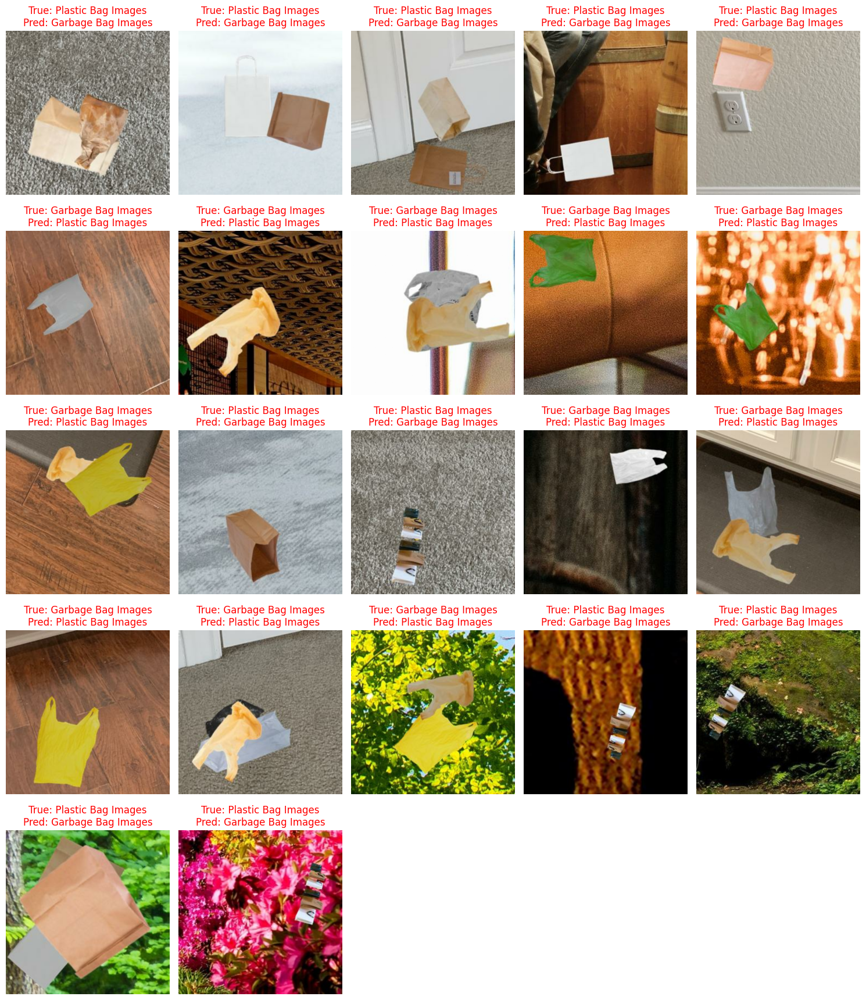

In [ ]:
plot_misclassified_samples_readable_v2(model=model,
                                       dataset=test_ds_preprocessed,
                                       index_to_class=inv_class_mappings,
                                       num_samples_to_check=500, # Check more samples if needed
                                       figsize=(15, 15), # Adjust figure size
                                       title_fontsize=12) # Adjust title font size

# Model Deployment

In [ ]:
import ipywidgets as widgets
from IPython.display import display, clear_output
import numpy as np
import tensorflow as tf
from PIL import Image
import io
import os
import matplotlib.pyplot as plt

# Define constants (should match what was used for training)
IMG_SIZE = (512, 512) # Using the tuple format as in image_dataset_from_directory
# Assuming 'classes' list is already defined from previous cells, e.g., ['Garbage Bag Images', 'Paper Bag Images', 'Plastic Bag Images']
# Make sure classes are strings
classes_list = [str(c) for c in classes] # Create a list of strings from the existing 'classes' variable

# Ensure model_path is correct
model_path = 'model.keras' # Assuming your trained model was saved as 'model.keras'

# Load the model
def load_model():
  print("Loading model...")
  try:
    # Use tf.keras.models.load_model with the correct path
    # We specify custom_objects if data_augmentation was a layer in the saved model
    # If data_augmentation was only used during model definition but not saved as part of the core graph,
    # you might not need custom_objects={'data_augmentation': None}.
    # However, including it is safer if the layer was saved.
    model = tf.keras.models.load_model(model_path, custom_objects={'data_augmentation': None})
    print("Model loaded successfully!")
    return model
  except Exception as e:
    print(f"Error loading model: {e}")
    # Print traceback for detailed error
    import traceback
    traceback.print_exc()
    return None

model = load_model()

# Ensure inverse class mapping is available for displaying predicted class names
if model is not None:
    # Create index_to_class mapping from the classes_list
    index_to_class = {i: name for i, name in enumerate(classes_list)}
    print("Index to class mapping created.")
else:
    index_to_class = {} # Empty mapping if model loading failed

def load_and_preprocess_image_alt(image_path, img_shape=IMG_SIZE):
    """
    Loads an image from a file path, decodes, resizes, and scales it,
    similar to preprocessing in image_dataset_from_directory.

    Args:
        image_path (str): Path to the image file.
        img_shape (tuple): Desired output shape (height, width).

    Returns:
        tf.Tensor: The loaded, preprocessed image tensor with batch dimension.
                   Returns None if there's an error.
    """
    try:
        # Read the image file
        img = tf.io.read_file(image_path)
        # Decode the image to a tensor (channels=3 for RGB)
        img = tf.io.decode_image(img, channels=3)
        # Ensure image has 3 channels if it was decoded as something else (e.g., grayscale)
        if img.shape[-1] != 3:
             img = tf.image.grayscale_to_rgb(img)

        # Convert to float32
        img = tf.image.convert_image_dtype(img, dtype=tf.float32)

        # Resize the image
        img = tf.image.resize(img, img_shape)

        # Add the batch dimension
        img = tf.expand_dims(img, axis=0)

        return img

    except tf.errors.TFBueno as e:
        print(f"TensorFlow error processing {image_path}: {e}")
        return None
    except Exception as e:
        print(f"An error occurred processing {image_path}: {e}")
        return None

  # Output Widget for Logs and Display
output_alt = widgets.Output()

# File Upload Widget
uploader_alt = widgets.FileUpload(
    accept='image/*',
    multiple=False
)

# Function to process uploaded image and make predictions (Alternative version)
def predict_uploaded_image_alt(change):
    with output_alt:
        clear_output(wait=True)
        if model is None:
            print("Model failed to load. Cannot make predictions.")
            return
        if not index_to_class:
             print("Class mapping not available. Cannot display class names.")
             return

        uploaded_files = change['new']
        if not uploaded_files:
            print("No file uploaded. Please upload an image.")
            return

        try:
            # Get the filename and content
            filename = list(uploaded_files.keys())[0]
            file_info = uploaded_files[filename]
            file_content = file_info['content']

            # We need a temporary file to use the file path based loading function
            # Or modify the loading function to accept byte content directly
            # For demonstration using the file path approach:
            temp_filepath = os.path.join('/tmp', filename) # Save to /tmp directory
            with open(temp_filepath, 'wb') as f:
                f.write(file_content)

            # Load and preprocess the image using the alternative function
            img_tensor = load_and_preprocess_image_alt(temp_filepath, img_shape=IMG_SIZE)

            # Clean up the temporary file
            os.remove(temp_filepath)

            if img_tensor is None:
                 print("Failed to preprocess image. Cannot make prediction.")
                 return

            # Predict
            pred_prob = model.predict(img_tensor)
            pred_index = np.argmax(pred_prob)
            pred_class = index_to_class.get(pred_index, "Unknown Class") # Use get with default for safety

            # Display the original image (using PIL to read from bytes again for plotting)
            image_for_display = Image.open(io.BytesIO(file_content)).convert("RGB")
            plt.imshow(image_for_display)
            plt.title(f"Prediction: {pred_class} (Confidence: {pred_prob.max():.4f})") # Format confidence
            plt.axis('off')
            plt.show()

        except Exception as e:
            print(f"Error processing image or predicting: {type(e).__name__}: {e}")
            import traceback
            traceback.print_exc()

  # Link the upload widget to the prediction function
uploader_alt.observe(predict_uploaded_image_alt, names='value')

# Display the widgets
print("Upload an image to classify (Alternative Method):")
display(uploader_alt, output_alt)

Loading model...
Model loaded successfully!
Index to class mapping created.
Upload an image to classify (Alternative Method):


FileUpload(value={}, accept='image/*', description='Upload')

Output()

In [ ]:
from google.colab import drive
import shutil
import os

try:
    drive.mount('/content/drive', force_remount=True) # This line mounts your Google Drive
    print("Google Drive mounted successfully.")
except Exception as e:
    print(f"Error mounting Google Drive: {e}")
    exit()

In [ ]:
from google.colab import drive
import os
import shutil

# Check if the mount point directory exists and has content
mountpoint = '/content/drive'
if os.path.exists(mountpoint) and os.listdir(mountpoint):
    print(f"Mountpoint '{mountpoint}' is not empty. Attempting to clean...")
    try:
        # Remove all contents within the mount point directory
        for item in os.listdir(mountpoint):
            item_path = os.path.join(mountpoint, item)
            if os.path.isdir(item_path):
                shutil.rmtree(item_path)
            else:
                os.remove(item_path)
        print(f"Mountpoint '{mountpoint}' cleaned.")
    except Exception as e:
        print(f"Error cleaning mountpoint '{mountpoint}': {e}")
        # You might want to raise the exception or exit here if cleaning is critical
        # raise


Mountpoint '/content/drive' is not empty. Attempting to clean...
Error cleaning mountpoint '/content/drive': [Errno 125] Operation canceled: '/content/drive/.file-revisions-by-id'


In [ ]:

# Attempt to mount Google Drive
try:
    print(f"Attempting to mount Google Drive at '{mountpoint}'...")
    drive.mount(mountpoint)
    print("Google Drive mounted successfully.")
except Exception as e:
    print(f"Error mounting Google Drive: {e}")
    # Print traceback for detailed error
    import traceback
    traceback.print_exc()

Attempting to mount Google Drive at '/content/drive'...
Mounted at /content/drive
Google Drive mounted successfully.


In [ ]:
colab_source_dataset_path = base_dir # Use the base directory of your split dataset
gdrive_target_parent_folder_name = 'Bag-Classification-Plastic-Paper-Garbage' # Adjust name if desired
gdrive_target_parent_path = f'/content/drive/MyDrive/{gdrive_target_parent_folder_name}'
gdrive_final_destination_path = os.path.join(gdrive_target_parent_path, os.path.basename(colab_source_dataset_path))

# Check if the source dataset directory exists in Colab
if os.path.exists(colab_source_dataset_path):
    print(f"Source dataset found at '{colab_source_dataset_path}'.")

    # Check if the target directory already exists in Google Drive
    if os.path.exists(gdrive_final_destination_path):
        print(f"Target dataset directory already exists in Google Drive: '{gdrive_final_destination_path}'. Skipping copy.")
    else:
        print(f"Target dataset directory does not exist: '{gdrive_final_destination_path}'. Proceeding with copy.")
        # Create the target parent directory in Google Drive if it doesn't exist
        try:
            if not os.path.exists(gdrive_target_parent_path):
                os.makedirs(gdrive_target_parent_path)
                print(f"Created target parent directory in Google Drive: '{gdrive_target_parent_path}'")
            else:
                print(f"Target parent directory already exists in Google Drive: '{gdrive_target_parent_path}'")

            print(f"Copying dataset from '{colab_source_dataset_path}' to '{gdrive_final_destination_path}'...")
            # Use shutil.copytree to copy the entire directory structure
            try:
                 shutil.copytree(colab_source_dataset_path, gdrive_final_destination_path)
                 print("Dataset copied to Google Drive successfully!")
            except FileExistsError:
                 print(f"Target directory already exists. Skipping copy of '{colab_source_dataset_path}'.")
            except Exception as e:
                 print(f"Error copying dataset to Google Drive: {e}")

        except Exception as e:
            print(f"Error creating target parent directory in Google Drive: {e}")

else:
    print(f"ERROR: Source dataset not found at '{colab_source_dataset_path}'. Please ensure it's loaded and split correctly before attempting to copy.")


Source dataset found at './dataset_split'.
Target dataset directory does not exist: '/content/drive/MyDrive/Bag-Classification-Plastic-Paper-Garbage/dataset_split'. Proceeding with copy.
Target parent directory already exists in Google Drive: '/content/drive/MyDrive/Bag-Classification-Plastic-Paper-Garbage'
Copying dataset from './dataset_split' to '/content/drive/MyDrive/Bag-Classification-Plastic-Paper-Garbage/dataset_split'...
Dataset copied to Google Drive successfully!


In [ ]:
colab_source_dataset_path = '/content/plastic-paper-garbage-bag-synthetic-images' # Use the base directory of your split dataset
gdrive_target_parent_folder_name = 'Bag-Classification-Plastic-Paper-Garbage' # Adjust name if desired
gdrive_target_parent_path = f'/content/drive/MyDrive/{gdrive_target_parent_folder_name}'
gdrive_final_destination_path = os.path.join(gdrive_target_parent_path, os.path.basename(colab_source_dataset_path))

# Check if the source dataset directory exists in Colab
if os.path.exists(colab_source_dataset_path):
    print(f"Source dataset found at '{colab_source_dataset_path}'.")

    # Check if the target directory already exists in Google Drive
    if os.path.exists(gdrive_final_destination_path):
        print(f"Target dataset directory already exists in Google Drive: '{gdrive_final_destination_path}'. Skipping copy.")
    else:
        print(f"Target dataset directory does not exist: '{gdrive_final_destination_path}'. Proceeding with copy.")
        # Create the target parent directory in Google Drive if it doesn't exist
        try:
            if not os.path.exists(gdrive_target_parent_path):
                os.makedirs(gdrive_target_parent_path)
                print(f"Created target parent directory in Google Drive: '{gdrive_target_parent_path}'")
            else:
                print(f"Target parent directory already exists in Google Drive: '{gdrive_target_parent_path}'")

            print(f"Copying dataset from '{colab_source_dataset_path}' to '{gdrive_final_destination_path}'...")
            # Use shutil.copytree to copy the entire directory structure
            try:
                 shutil.copytree(colab_source_dataset_path, gdrive_final_destination_path)
                 print("Dataset copied to Google Drive successfully!")
            except FileExistsError:
                 print(f"Target directory already exists. Skipping copy of '{colab_source_dataset_path}'.")
            except Exception as e:
                 print(f"Error copying dataset to Google Drive: {e}")

        except Exception as e:
            print(f"Error creating target parent directory in Google Drive: {e}")

else:
    print(f"ERROR: Source dataset not found at '{colab_source_dataset_path}'. Please ensure it's loaded and split correctly before attempting to copy.")


Source dataset found at '/content/plastic-paper-garbage-bag-synthetic-images'.
Target dataset directory does not exist: '/content/drive/MyDrive/Bag-Classification-Plastic-Paper-Garbage/plastic-paper-garbage-bag-synthetic-images'. Proceeding with copy.
Target parent directory already exists in Google Drive: '/content/drive/MyDrive/Bag-Classification-Plastic-Paper-Garbage'
Copying dataset from '/content/plastic-paper-garbage-bag-synthetic-images' to '/content/drive/MyDrive/Bag-Classification-Plastic-Paper-Garbage/plastic-paper-garbage-bag-synthetic-images'...
Dataset copied to Google Drive successfully!


.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

.

In [ ]:
# prompt: when i download this notebook to pdf there's a keyerror: 'state' give me a code to fix it

# To fix the KeyError: 'state' when downloading to PDF, you typically need to reset
# the Matplotlib backend or environment before saving.
# This error often occurs in environments like Colab when plots are generated
# using an interactive backend that doesn't serialize cleanly when creating
# a static output like PDF.

# Add these lines near the beginning of your notebook, or just before you might
# attempt to save the notebook as a PDF (though the PDF download is usually
# initiated from the Colab UI).

import matplotlib.pyplot as plt

# Reset the Matplotlib backend to a non-interactive one
# This should be done *before* any plotting functions are called if possible,
# or at least before attempting to save.
plt.ioff() # Turn off interactive mode if it's on

# If you encounter the error consistently on PDF export, try explicitly setting
# a non-interactive backend. The 'Agg' backend is a good choice for non-GUI
# environments like Colab when generating static output.
import matplotlib
matplotlib.use('Agg')

# Re-import or ensure your plotting functions are called *after* this line.
# If you have already generated plots before adding this, you might need to
# re-run the plotting cells.

# Example of a simple plot after setting the backend (if you need one)
# plt.figure()
# plt.plot([0, 1], [0, 1])
# plt.title("Example Plot")
# plt.show() # This will likely not display in Colab with 'Agg', but it helps create the plot object

# It's also good practice to close plots after showing them, though less likely
# to cause the 'state' error directly.
# plt.close('all') # Close all figures

# Continue with the rest of your notebook code.
# The primary fix attempt is the `matplotlib.use('Agg')` line.
